# SpatialMouse preprocessing - each organ separately

In [1]:
## The following code ensures that all functions and init files are reloaded before executions.
%load_ext autoreload
%autoreload 2

In [2]:
## Import the custom library
import os
import sys

# add xDbit toolbox path to path variable
module_path = os.path.abspath("../../")
if module_path not in sys.path:
    sys.path.append(module_path)

import xdbit_funcs as db

In [3]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from glob import glob
from pathlib import Path
import seaborn as sns
import gc
import anndata

In [4]:
plt.rcParams['figure.dpi'] = 100
plt.style.use('default')

# Load data

In [5]:
# directories
data_dir = "out"

# get files
input_files = sorted(glob(os.path.join(data_dir, "*_clean_wohires.h5ad")))

In [6]:
adatas = {os.path.basename(f).split("_")[0]: sc.read(f) for f in input_files}

In [7]:
adatas

{'Brain': AnnData object with n_obs × n_vars = 1937 × 7736
     obs: 'array_row', 'array_col', 'um_row', 'um_col', 'id', 'pixel_row', 'pixel_col', 'dapi_mean', 'dapi_mean_norm', 'experiment_id', 'organism', 'age', 'organ', 'age_months', 'mouse_id', 'exp_date', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
     var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
     uns: 'matchedVis', 'registered', 'spatial'
     obsm: 'spatial',
 'Heart': AnnData object with n_obs × n_vars = 4415 × 6106
     obs: 'array_row', 'array_col', 'um_row', 'um_col', 'id', 'pixel_row', 'pixel_col', 'dapi_mean', 'dapi_mean_norm', 'experiment_id', 'organism', 'age', 'organ', 'age_months', 'mouse_id', 'exp_date', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
     var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
     uns: 'matchedVis', 'registered', 'spatial'
     obsm: 'spatial',
 'Kidney':

# Preprocessing and analysis of Dbit-seq data

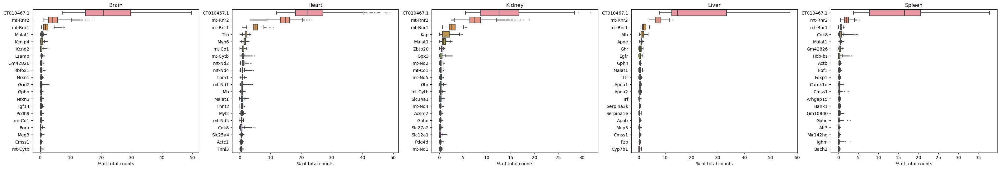

In [8]:
ncols = len(adatas)
fig, axs = plt.subplots(1, ncols, figsize=(8*ncols, 6))

for i, (organ, adata) in enumerate(adatas.items()):
    sc.plotting.highest_expr_genes(adata, n_top = 20, ax=axs[i], show=False)
    axs[i].set_title(organ)

### Removal of indicator of ribosomal contamination
We observed very high expression of the gene `CT010467.1` across all organs in our dataset. This was also the case in other studies using a poly(A) targeting approach such as datasets of the encode project used in notebook `03` and in https://doi.org/10.1038/s41467-021-24543-5. <br>

- As stated here (https://www.nxn.se/valent/2017/9/5/atnvo2gidxn1leskaboauiw6pfz0rv) these high expression could indicate ribosomal contamination.

- Further this gene is apparently a post-isolation artifact
"To avoid isolation artifacts, we established an automated dissociation protocol for microglia that inhibits ex vivo transcription by addition of actinomycin D (ActD) (Wu et al., 2017). Using scRNA-seq, we tested the effect of ActD addition, which was able to prevent significant induction of four genes (Jun, Lars2, Gm23935, and CT010467.1) and of average expression of immediate-early genes known to respond to brain dissociation (Wu et al., 2017; Figures S1A–S1C; STAR methods)" (https://www.sciencedirect.com/science/article/pii/S0896627321000738)

- Conclusion: Since the amount of this gene could influence the normalization, we decided to exclude the gene from the analysis.

In [9]:
# calculate 18S percentage
ct_gene = 'CT010467.1'

for adata in adatas.values():
    ribo_idx = adata.var.index.get_loc(ct_gene)
    ribo_counts = adata.X[:, ribo_idx]
    adata.obs['{}_pct'.format(ct_gene)] = ribo_counts / adata.obs.total_counts * 100
    
# Filter out overly abundant 18S-related gene
for organ, adata in adatas.items():
    adatas[organ] = adata[:, ~(adata.var_names == ct_gene)].copy()

### Calculate qc metrics

In [10]:
for adata in adatas.values():
    adata.var['mt'] = adata.var_names.str.contains('MT-', case=False)  # annotate the group of mitochondrial genes as 'mt'
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

## Filtering based on gene counts

To remove spots with very low read/gene counts we apply filtering on this parameter.

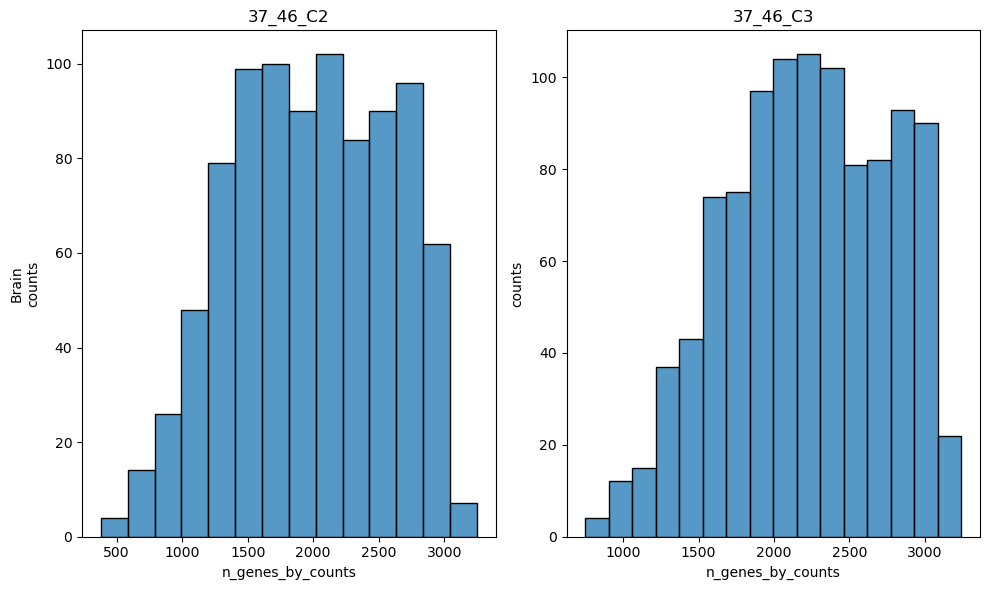

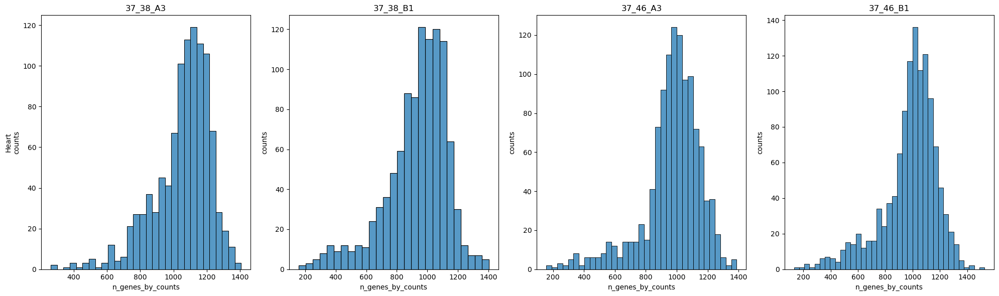

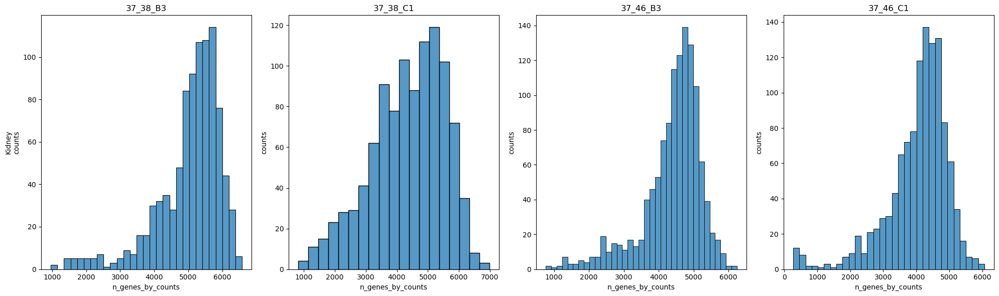

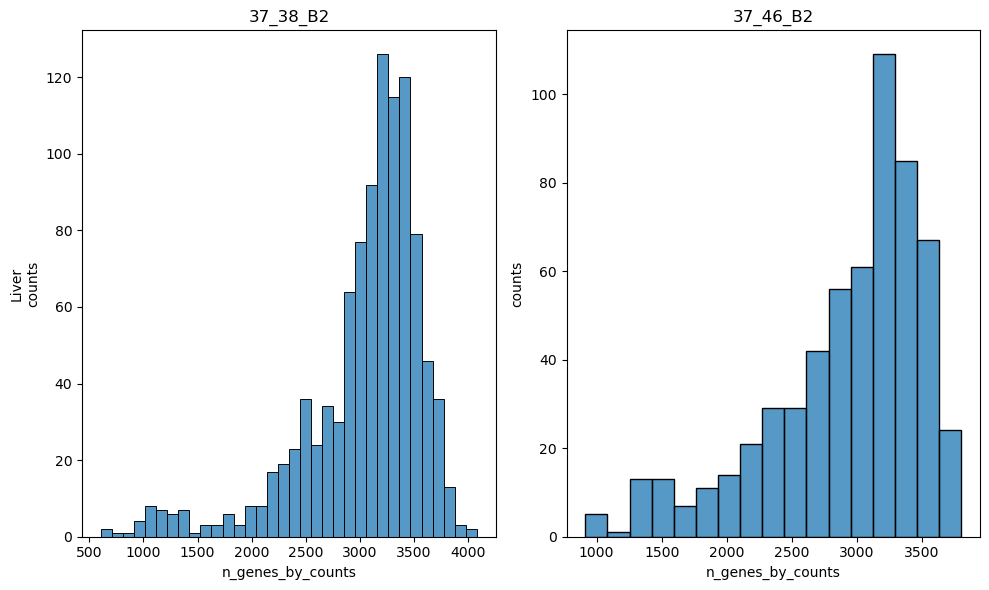

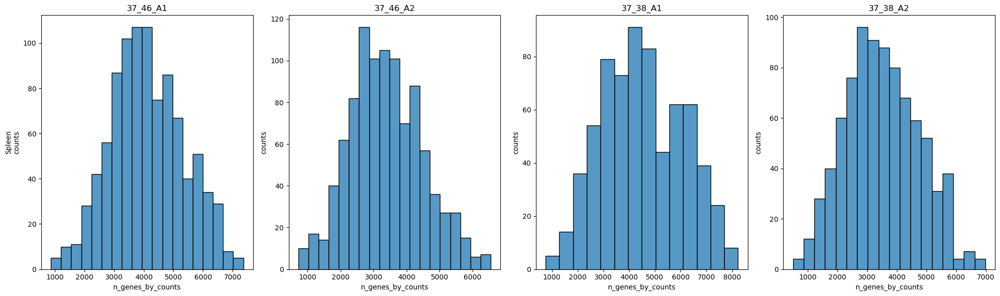

In [11]:
for organ, adata in adatas.items():

    #exps = adata.obs['experiment_id'].unique().tolist()
    indices = adata.obs['id'].unique().tolist()

    fig, axs = plt.subplots(1, len(indices), figsize=(5*len(indices), 6))

    #axs = axs.ravel()

    for c, idx in enumerate(indices):
        # extract counts
        a = adata[adata.obs['id'] == idx, :]
        counts = a.obs["n_genes_by_counts"]
        
        # plot histogram
        sns.histplot(counts, kde=False, ax=axs[c])
        axs[c].set_title(idx)
        
        if c == 0:
            axs[c].set_ylabel("{}\ncounts".format(organ))
        else:
            axs[c].set_ylabel("counts")

    fig.tight_layout()
    #plt.savefig("figures/histograms_beforefiltering.png", dpi=200, bbox_inches='tight')
    plt.show()

### Manually set filtering thresholds

In most cases the Otsu filtering would be too restrictive here or does not work properly since there is no real population to make the cutoff. E.g. A1 and A2 show a nice gaussian distribution and don't need any filtering. Therefore, I do the filtering here manually for some wells only.

In [12]:
threshold_dict = {
    "37_38_A1": 1500, "37_38_A2": 1500, "37_38_A3": 700, "37_38_B1": 700, "37_38_B2": 2000, 
    "37_38_B3": 3000, "37_38_C1": 2000,
    "37_46_A1": 2000, "37_46_A2": 2000, "37_46_A3": 700, "37_46_B1": 700, "37_46_B2": 2000, 
    "37_46_B3": 3000, "37_46_C1": 2000, "37_46_C2": 1000, "37_46_C3": 1000
}

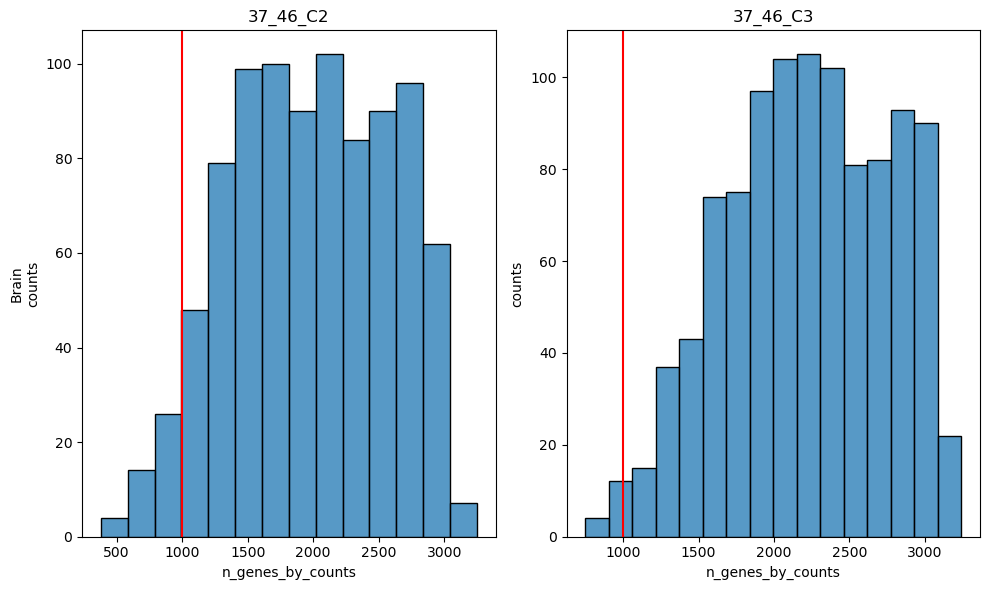

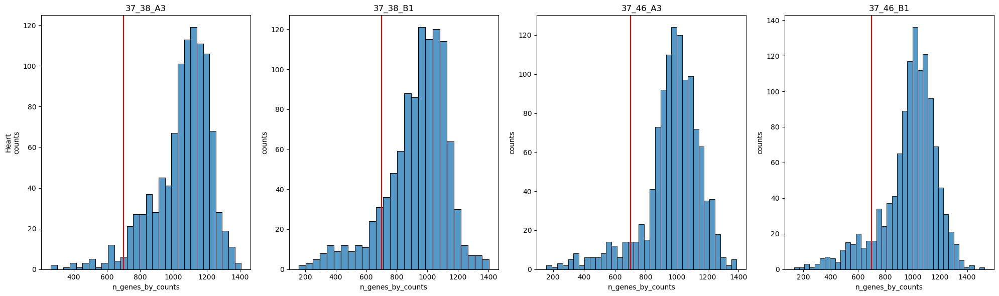

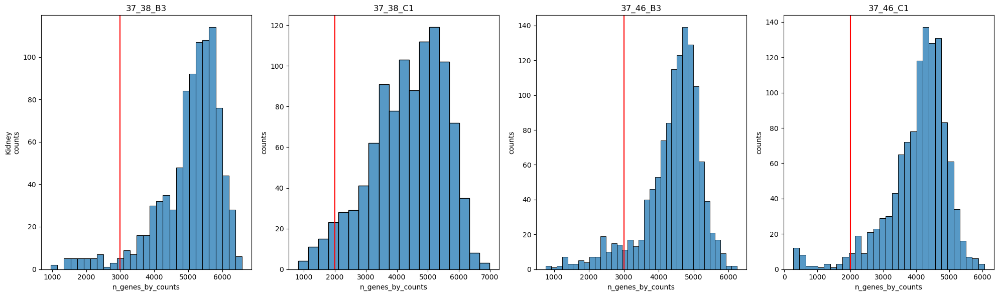

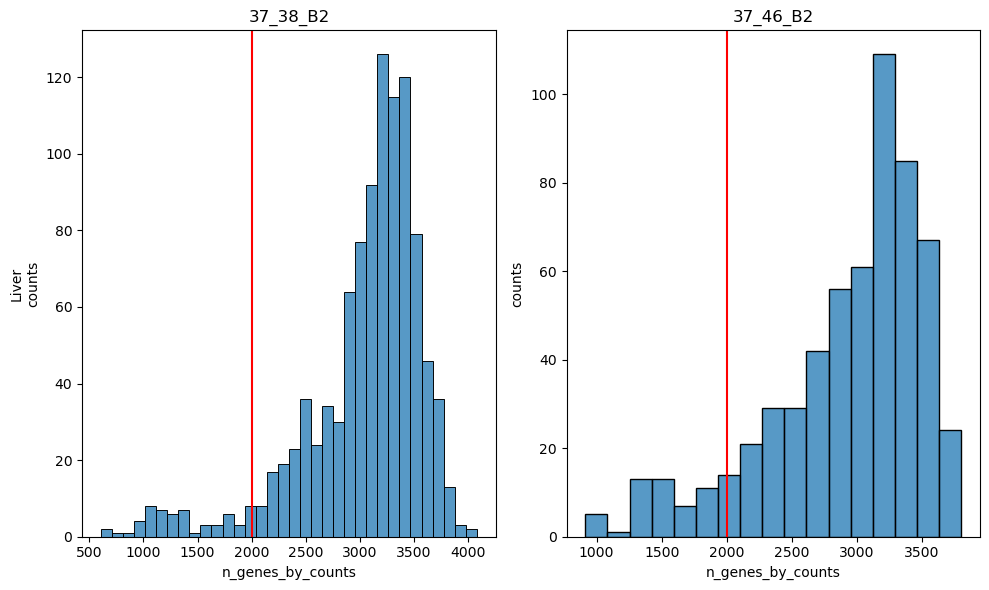

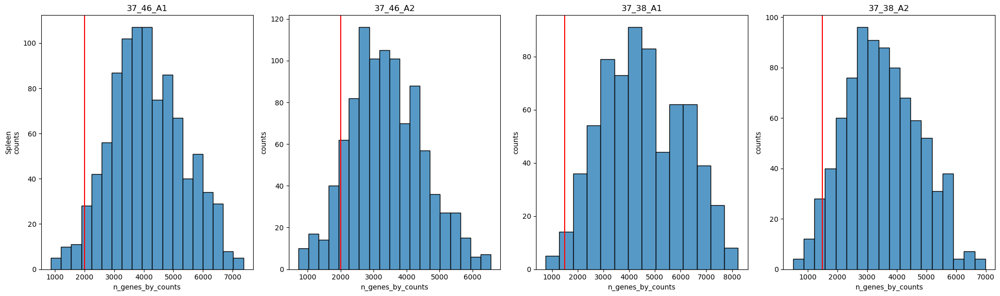

In [13]:
for organ, adata in adatas.items():

    #exps = adata.obs['experiment_id'].unique().tolist()
    indices = adata.obs['id'].unique().tolist()

    fig, axs = plt.subplots(1, len(indices), figsize=(5*len(indices), 6))

    #axs = axs.ravel()

    for c, idx in enumerate(indices):
        # extract counts
        a = adata[adata.obs['id'] == idx, :]
        counts = a.obs["n_genes_by_counts"]

        # get threshold
        thresh = threshold_dict[idx]
        
        # plot histogram
        sns.histplot(counts, kde=False, ax=axs[c])
        axs[c].axvline(thresh, color='r')
        axs[c].set_title(idx)
        
        if c == 0:
            axs[c].set_ylabel("{}\ncounts".format(organ))
        else:
            axs[c].set_ylabel("counts")

    fig.tight_layout()
    #plt.savefig("figures/histograms_beforefiltering.png", dpi=200, bbox_inches='tight')
    plt.show()

### Do filtering

In [14]:
min_cells_thresh = 10

for organ, adata in adatas.items():
    indices = adata.obs['id'].unique()

    # run filtering
    for idx in indices:
        # mask for indices
        in_well = adata.obs['id'] == idx

        # mask for threshold
        below = adata.obs['n_genes_by_counts'] < threshold_dict[idx]

        # create final filtering mask
        keep = ~(in_well & below)

        # filter
        adata = adata[keep].copy()

    # filter for genes that appear only in a very small subset of spots
    #sc.pp.filter_genes(adata, min_cells = min_cells_thresh)
    
    # add to dict
    adatas[organ] = adata

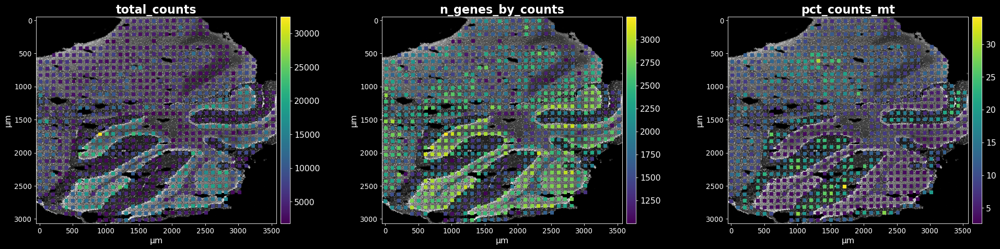

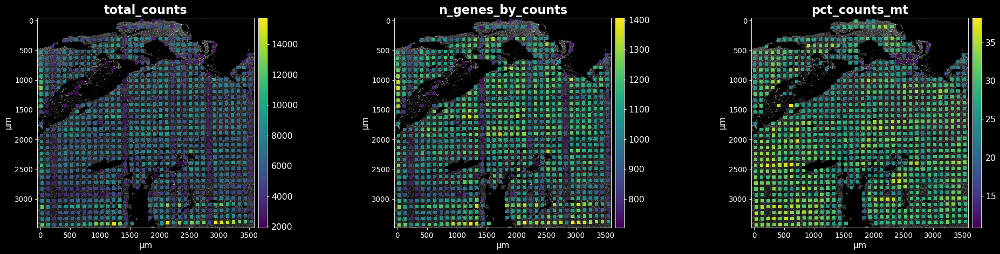

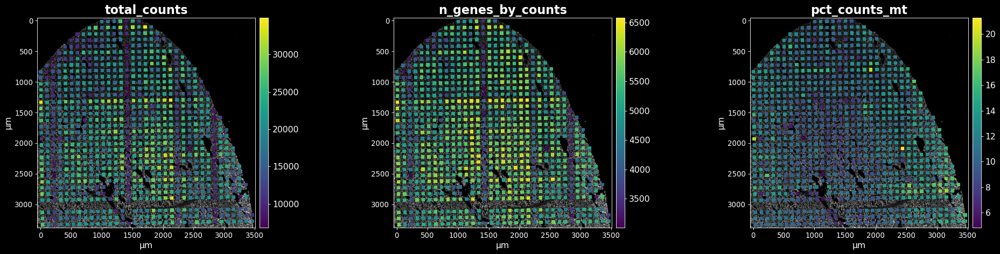

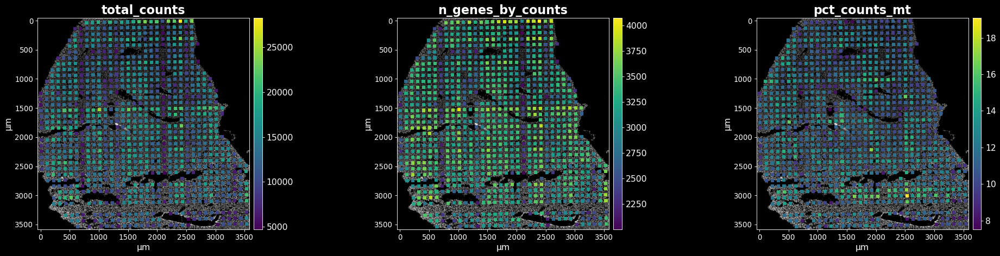

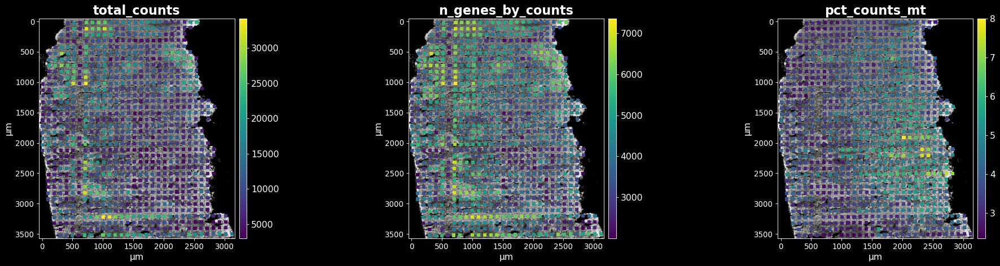

In [15]:
for adata in adatas.values():
    group = adata.obs['id'].unique()[0]
    with plt.style.context('dark_background'):
        db.pl.spatial(adata, keys=['total_counts', 'n_genes_by_counts', 'pct_counts_mt'], groupby="id",
                             groups=group, image_key='dapi')

## Save filtered but unnormalized data

In [16]:
for organ, adata in adatas.items():
    savefile = os.path.join(data_dir, "{}_adata_filtered_unnormalized_wohires.h5ad".format(organ))
    print("Save {} data into {}".format(organ, savefile))
    sc.write(savefile, adata)

Save Brain data into out\Brain_adata_filtered_unnormalized_wohires.h5ad
Save Heart data into out\Heart_adata_filtered_unnormalized_wohires.h5ad
Save Kidney data into out\Kidney_adata_filtered_unnormalized_wohires.h5ad
Save Liver data into out\Liver_adata_filtered_unnormalized_wohires.h5ad
Save Spleen data into out\Spleen_adata_filtered_unnormalized_wohires.h5ad


## Normalization, log, HVGs, dimensionality reduction, clustering

In [17]:
for organ, adata in adatas.items():
    adatas[organ] = db.tl.standard_preprocessing(adata, 
                                                   hvg_batch_key='id', hvg_flavor='seurat', hvg_n_top_genes=2000,
                                                   batch_correction_key='id', batch_correction_method="scanorama", verbose=False)

Store raw counts in adata.layers['counts']...
Normalization, log-transformation...
Calculate highly-variable genes per batch key id using seurat flavor...
Batch correction using scanorama for id...
Found 2000 genes among all datasets
Leiden clustering...
Store raw counts in adata.layers['counts']...
Normalization, log-transformation...
Calculate highly-variable genes per batch key id using seurat flavor...
Batch correction using scanorama for id...
Found 2000 genes among all datasets
Leiden clustering...
Store raw counts in adata.layers['counts']...
Normalization, log-transformation...
Calculate highly-variable genes per batch key id using seurat flavor...
Batch correction using scanorama for id...
Found 2000 genes among all datasets
Leiden clustering...
Store raw counts in adata.layers['counts']...
Normalization, log-transformation...
Calculate highly-variable genes per batch key id using seurat flavor...
Batch correction using scanorama for id...
Found 2000 genes among all datasets
L

### Dimensionality reduction - Visualization

In [18]:
target_cats = ["leiden", "pct_counts_mt", "experiment_id", "id", "organ"]

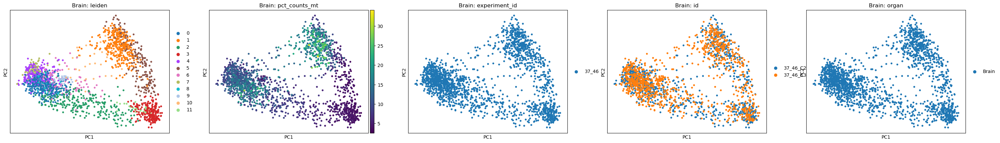

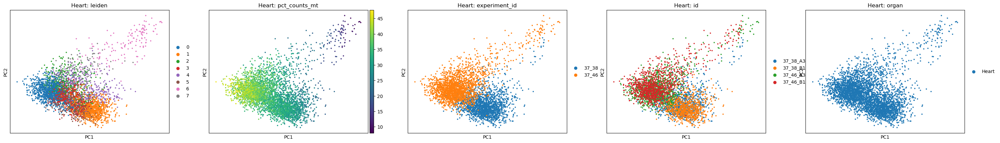

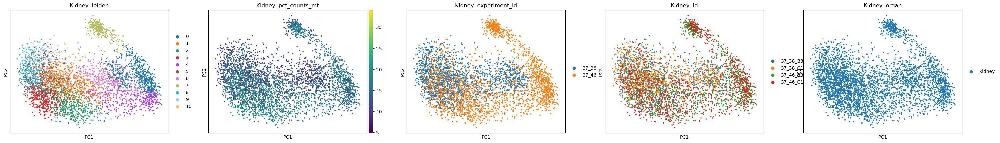

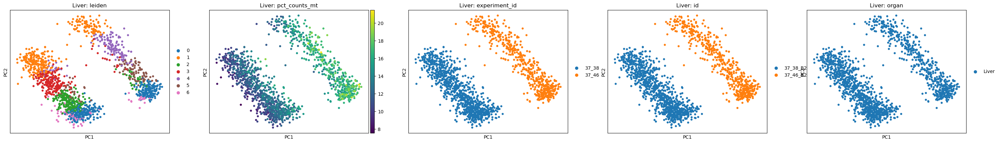

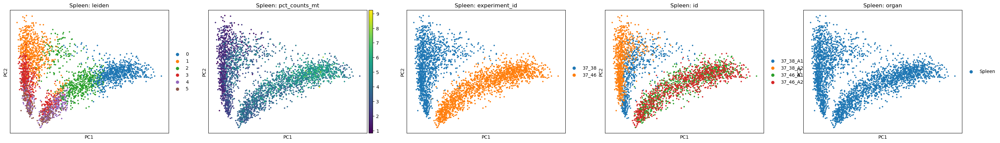

In [19]:
for organ, adata in adatas.items():
    titles = ["{}: {}".format(organ, cat) for cat in target_cats]
    sc.pl.pca(adata, color=target_cats, ncols=len(target_cats), title=titles)

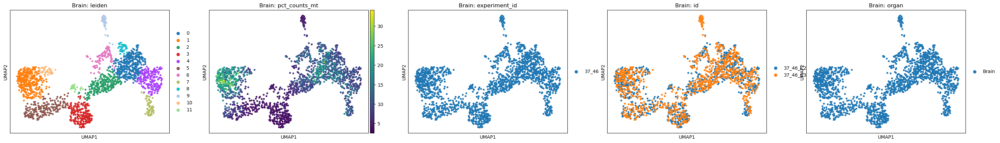

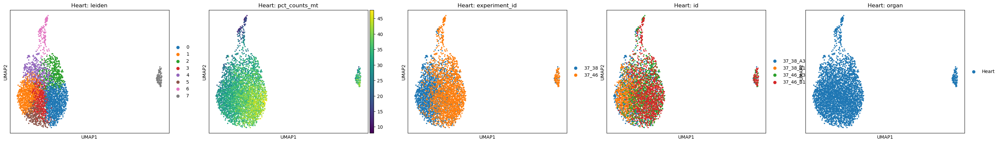

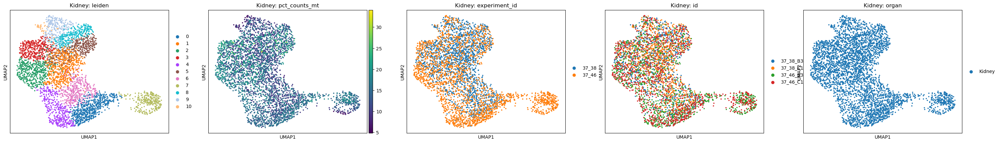

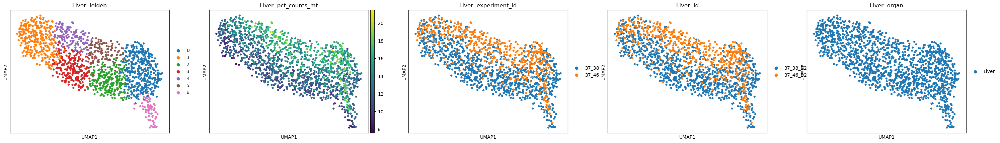

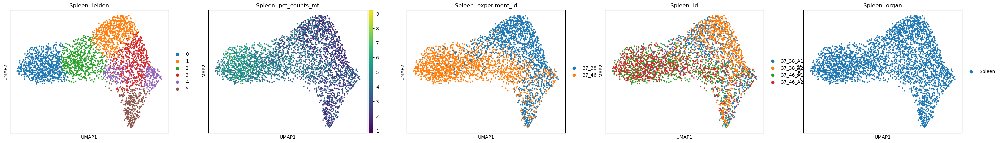

In [20]:
for organ, adata in adatas.items():
    titles = ["{}: {}".format(organ, cat) for cat in target_cats]
    sc.pl.umap(adata, color=target_cats, ncols=len(target_cats), title=titles)

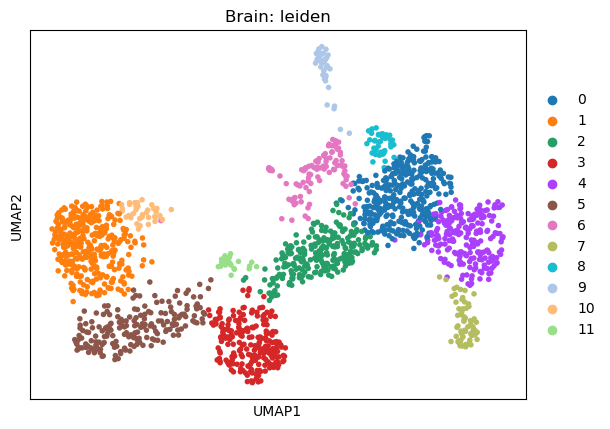

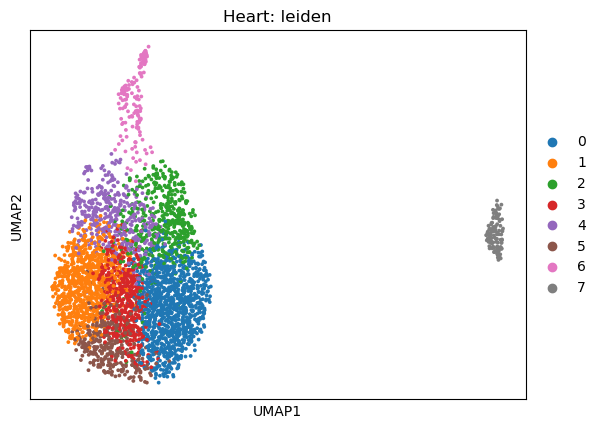

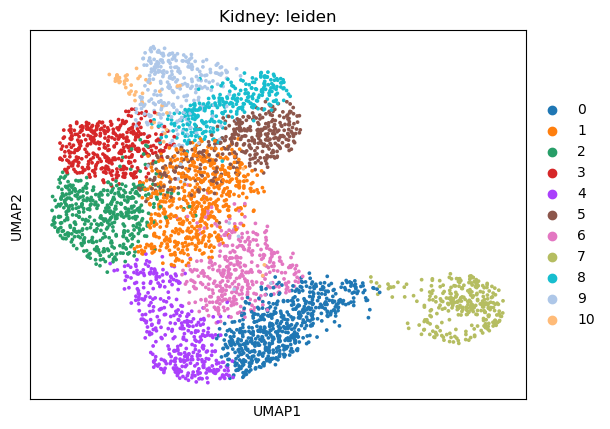

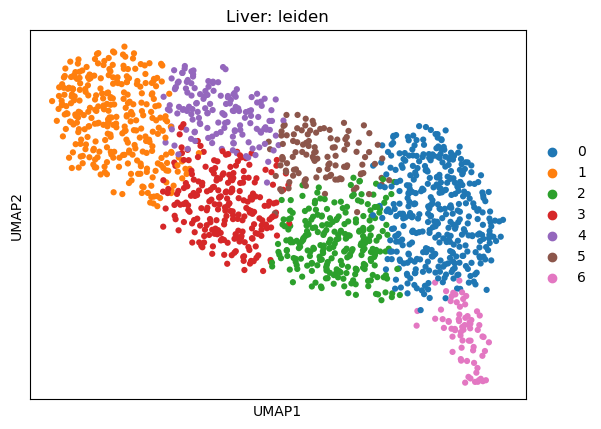

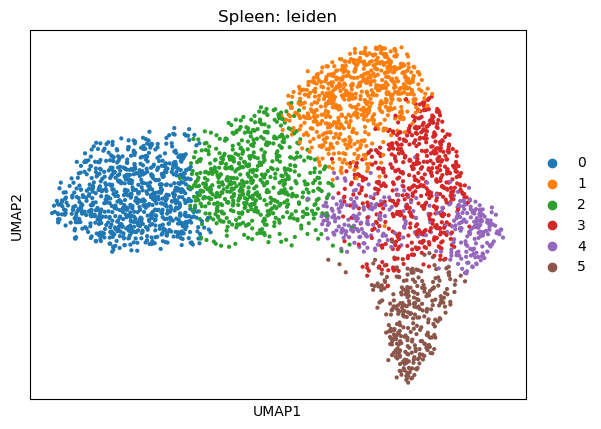

In [21]:
for organ, adata in adatas.items():
    #titles = ["{}: {}".format(organ, cat) for cat in ["leiden"]]
    sc.pl.umap(adata, color="leiden", ncols=5, title="{}: leiden".format(organ), save="_{}_leiden.png".format(organ))

# Save preprocessed results without hires images

In [22]:
for organ, adata in adatas.items():
    savepath = os.path.join(data_dir, "{}_adata_pp_wohires.h5ad".format(organ))
    print("Save {} dataset into: {}".format(organ, savepath))
    adata.write(savepath)

Save Brain dataset into: out\Brain_adata_pp_wohires.h5ad
Save Heart dataset into: out\Heart_adata_pp_wohires.h5ad
Save Kidney dataset into: out\Kidney_adata_pp_wohires.h5ad
Save Liver dataset into: out\Liver_adata_pp_wohires.h5ad
Save Spleen dataset into: out\Spleen_adata_pp_wohires.h5ad


# Reload results

In [23]:
files = glob(os.path.join(data_dir, "*_adata_pp_wohires.h5ad"))

adatas = {}
for file in files:
    organ = os.path.basename(file).split("_")[0]
    adatas[organ] = sc.read(file)

# Compare pseudo-bulk gene expression across samples per Organ

In [24]:
def log_cpm(values, target_sum=1e6):
    return np.log(values / values.sum() * target_sum)

groupby = 'id'

logcpm = {}
for organ, adata in adatas.items():
    logcpm[organ] = {}
    for idx in adata.obs[groupby].unique():
        # get counts
        x = adata[adata.obs[groupby] == idx].layers['counts'].sum(axis=0)
        logcpm[organ][idx] = x
    logcpm[organ] = pd.DataFrame(logcpm[organ])
    logcpm[organ] = logcpm[organ].apply(log_cpm, axis=0)

C:\Users\Johannes\anaconda3\envs\spatial\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [25]:
# calculate correlation matrix
cormats = {}
for organ in logcpm:
    cormats[organ] = logcpm[organ].corr()

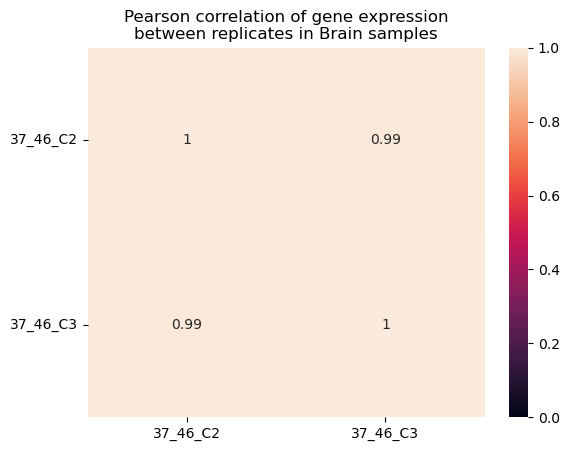

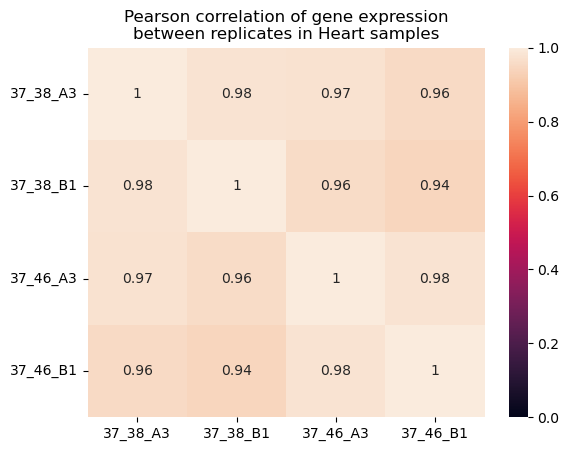

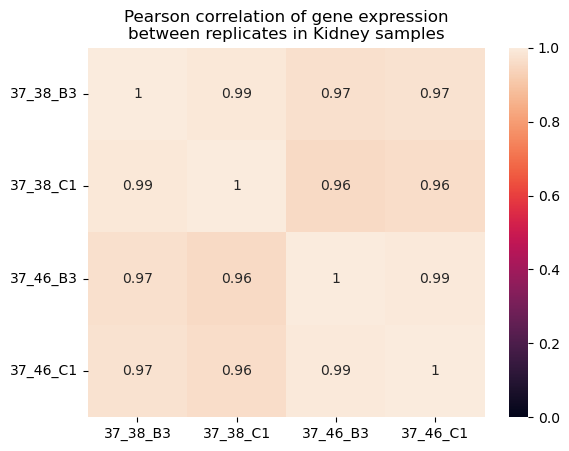

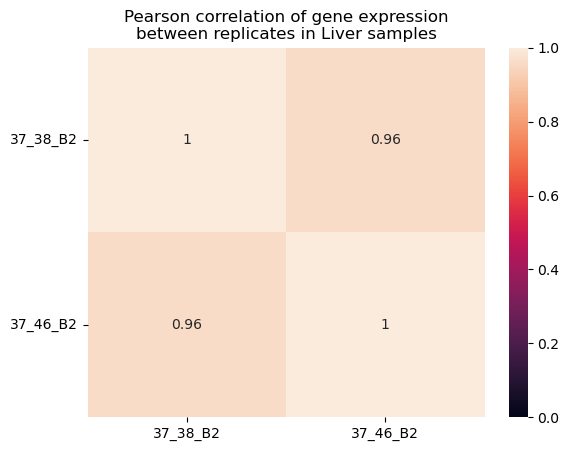

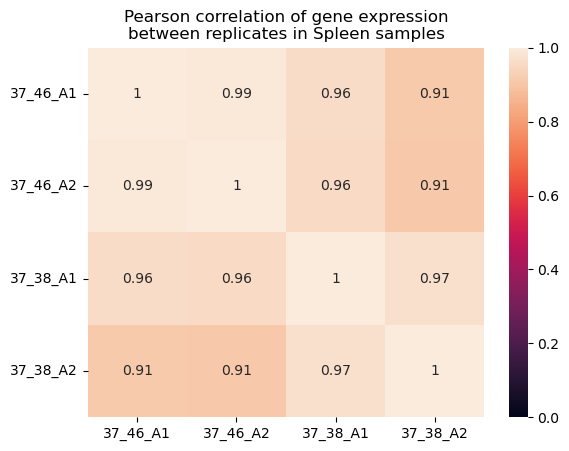

In [26]:
for organ, cormat in cormats.items():
    sns.heatmap(cormat, vmin=0, vmax=1, annot=True)
    plt.yticks(va='center', rotation=0)
    plt.title('Pearson correlation of gene expression\nbetween replicates in {} samples'.format(organ))
    #plt.title("Pearson correlation of gene expression\nbetween replicates in " + "\textbf{" + organ + "}" + " samples")
    plt.savefig("figures/heatmap_pearson_{}.pdf".format(organ), dpi=300, bbox_inches = 'tight')
    plt.show()